For Pleiades Dataset:

Mounted at /content/drive


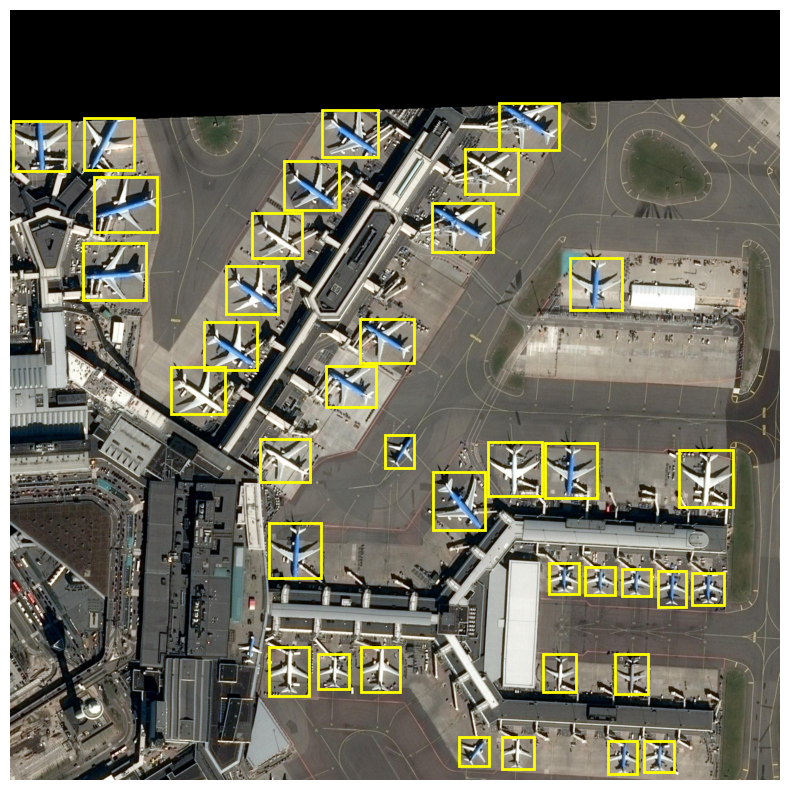

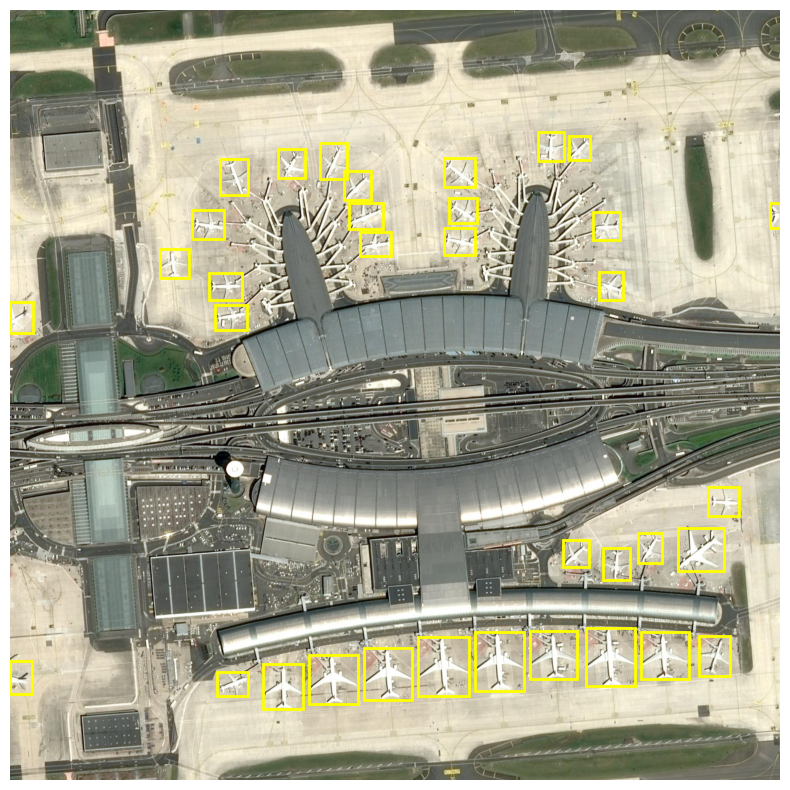

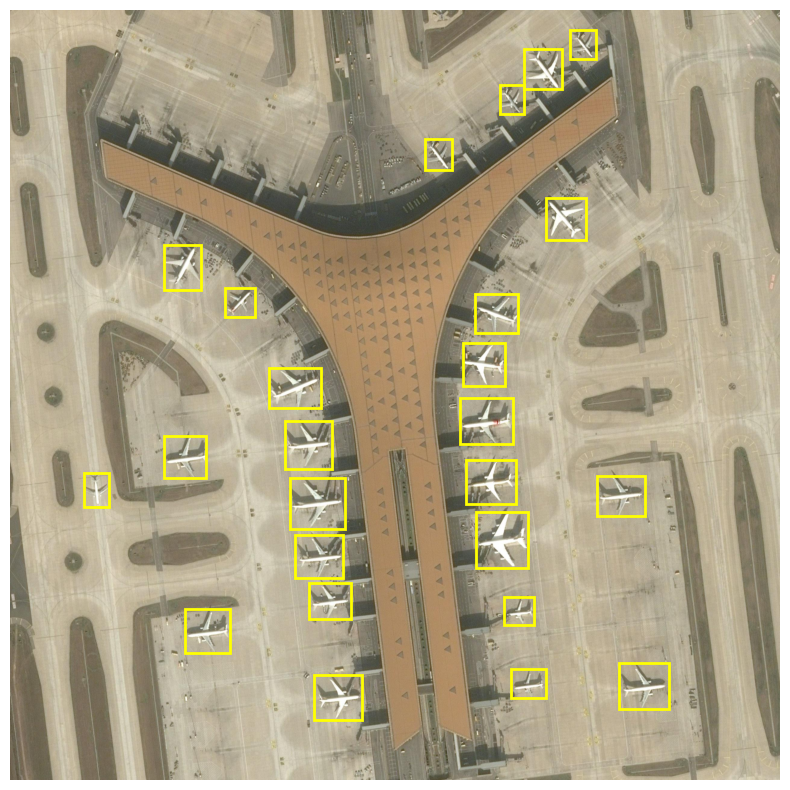

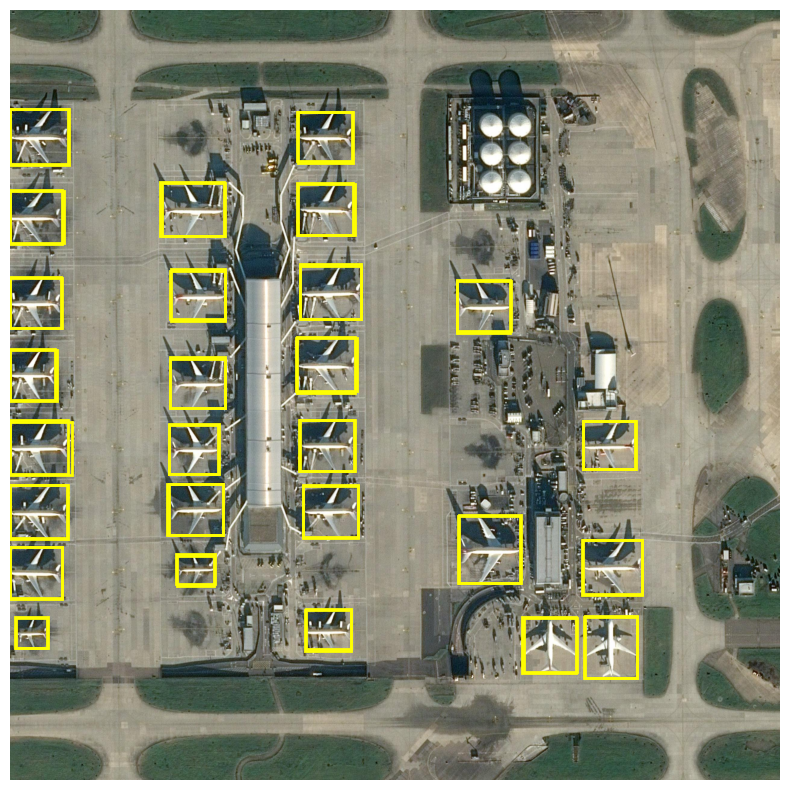

In [1]:
# ✅ 1. Monter Google Drive
from google.colab import drive
drive.mount('/content/drive')

# ✅ 2. Imports
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# ✅ 3. Définir les chemins
images_dir = "/content/drive/MyDrive/Predicted_Images/"
annotations_path = "/content/drive/MyDrive/Pleiades/images/Pleiades_original/annotations.csv"
output_dir = "/content/drive/MyDrive/Ground_Truth_Pleiades"
os.makedirs(output_dir, exist_ok=True)

# ✅ 4. Charger les annotations avec les bonnes colonnes
df = pd.read_csv(annotations_path)
df['bbox'] = df['bbox'].apply(eval)  # Convertir les chaînes "[x, y, w, h]" en liste

# ✅ 5. Lister les images à traiter
image_files = [f for f in os.listdir(images_dir) if f.lower().endswith((".jpg", ".png"))]

# ✅ 6. Afficher et enregistrer les images annotées
for img_name in image_files:
    img_path = os.path.join(images_dir, img_name)
    img = Image.open(img_path)

    # Extraire les annotations correspondantes
    img_annotations = df[df['image_id'] == img_name]

    # Créer la figure
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(img)

    if img_annotations.empty:
        print(f"⚠️ Aucune annotation trouvée pour : {img_name}")
    else:
        # Ajouter chaque bbox
        for _, row in img_annotations.iterrows():
            x, y, w, h = row['bbox']
            rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='yellow', facecolor='none')
            ax.add_patch(rect)

    ax.axis('off')

    # 💾 Sauvegarder AVANT plt.show()
    output_path = os.path.join(output_dir, f"gt_{img_name}")
    plt.savefig(output_path, bbox_inches='tight', pad_inches=0)
    plt.show()
    plt.close()

For SSDD Dataset:

Mounted at /content/drive


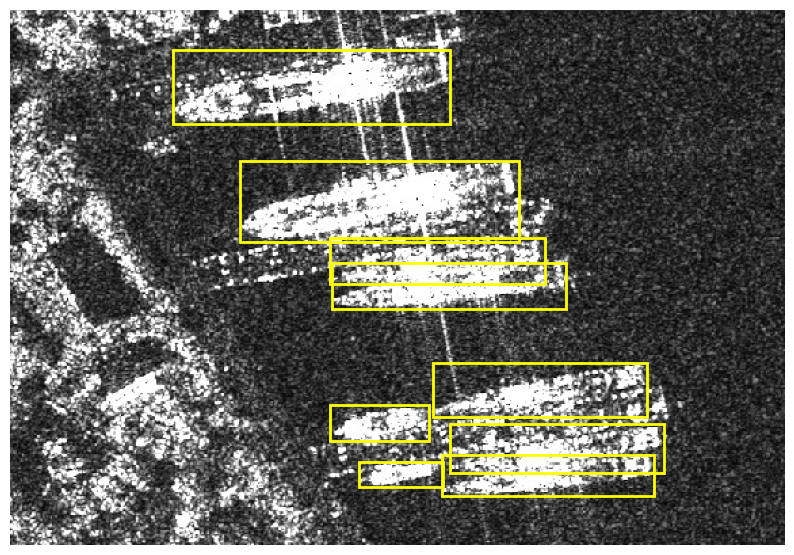

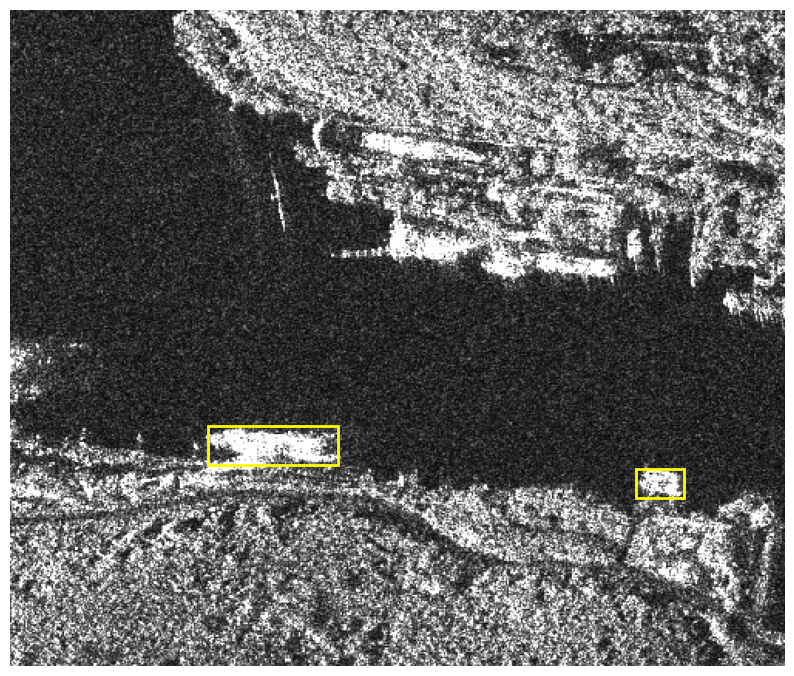

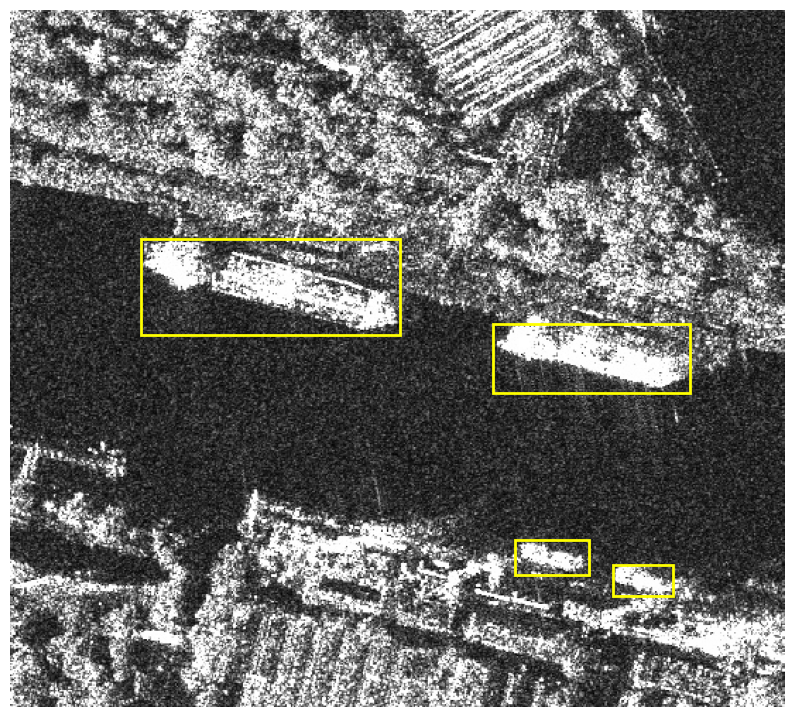

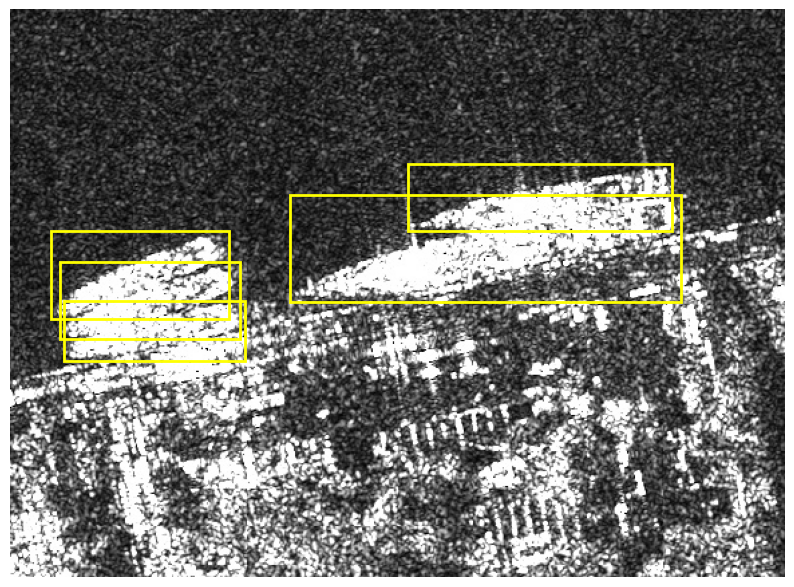

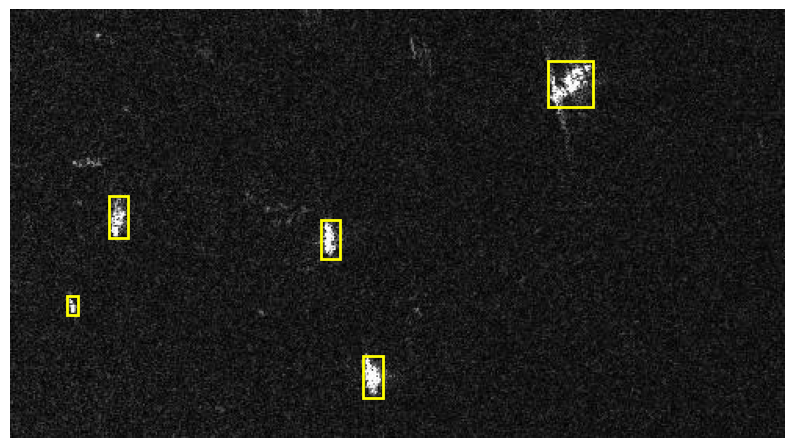

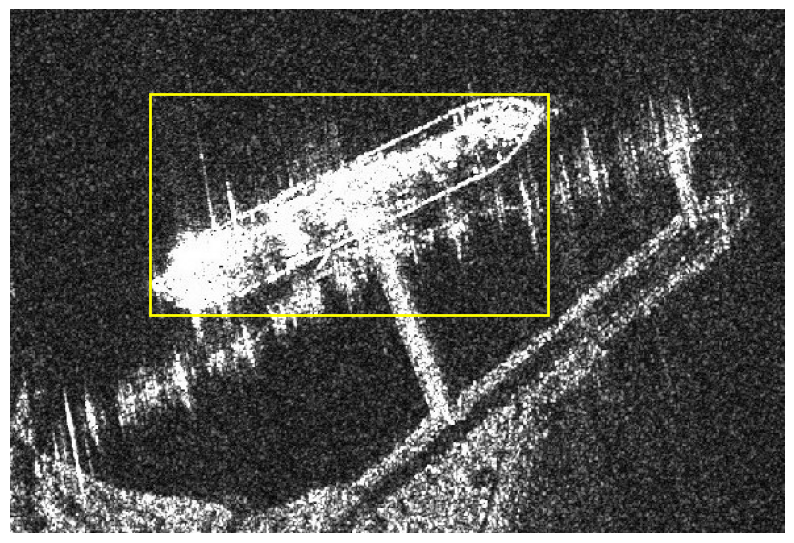

In [2]:
# ✅ 1. Monter Google Drive
from google.colab import drive
drive.mount('/content/drive')

# ✅ 2. Imports
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# ✅ 3. Définir les chemins
images_dir = "/content/drive/MyDrive/Predicted_SAR_Images/"
annotations_path = "/content/drive/MyDrive/annotations_coco_ships.csv"
output_dir = "/content/drive/MyDrive/Ground_Truth_SSDD"
os.makedirs(output_dir, exist_ok=True)

# ✅ 4. Charger les annotations avec les bonnes colonnes
df = pd.read_csv(annotations_path)
df['bbox'] = df['bbox'].apply(eval)  # Convertir les chaînes "[x, y, w, h]" en liste

# ✅ 5. Lister les images à traiter
image_files = [f for f in os.listdir(images_dir) if f.lower().endswith((".jpg", ".png"))]

# ✅ 6. Afficher et enregistrer les images annotées
for img_name in image_files:
    img_path = os.path.join(images_dir, img_name)
    img = Image.open(img_path)

    # Extraire les annotations correspondantes
    img_annotations = df[df['id'] == img_name]

    # Créer la figure
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(img)

    if img_annotations.empty:
        print(f"⚠️ Aucune annotation trouvée pour : {img_name}")
    else:
        # Ajouter chaque bbox
        for _, row in img_annotations.iterrows():
            x, y, w, h = row['bbox']
            rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='yellow', facecolor='none')
            ax.add_patch(rect)

    ax.axis('off')

    # 💾 Sauvegarder l'image annotée AVANT plt.show()
    output_path = os.path.join(output_dir, f"gt_{img_name}")
    plt.savefig(output_path, bbox_inches='tight', pad_inches=0, dpi=300)

    # ➕ Affichage dans Colab
    plt.show()
    plt.close()